In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

# Create SIFT & ORB algoritms

In [2]:
SIFT = cv2.SIFT_create()
ORB = cv2.ORB_create()

def detect_match(img1, img2, detector, is_sift=False):
    keypoint1, des1 = detector.detectAndCompute(img1, None)
    keypoint2, des2 = detector.detectAndCompute(img2, None)

    if is_sift:
        bf = cv2.BFMatcher(cv2.NORM_L2)
    else:
        bf = cv2.BFMatcher(cv2.NORM_HAMMING)
    
    match = bf.knnMatch(des1, des2, k=2)

    matches = []
    for m,n in match:
        if m.distance < 0.75*n.distance:
            matches.append(m)

    return keypoint1,keypoint2, matches

In [3]:
def show_matches(img1, img2, kp1, kp2, matches, title):
    img_matches = cv2.drawMatches(img1, kp1, img2, kp2, matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    plt.figure(figsize=(10, 5))
    plt.title(title)
    plt.imshow(img_matches)
    plt.show()

In [4]:
def add_gaussian_noise(image, mean=0, sigma=25):
    noise = np.random.normal(mean, sigma, image.shape).astype('uint8')
    noisy_image = cv2.add(image, noise)
    return noisy_image

# Tesing Keypoint Matches with Images

## Image 1

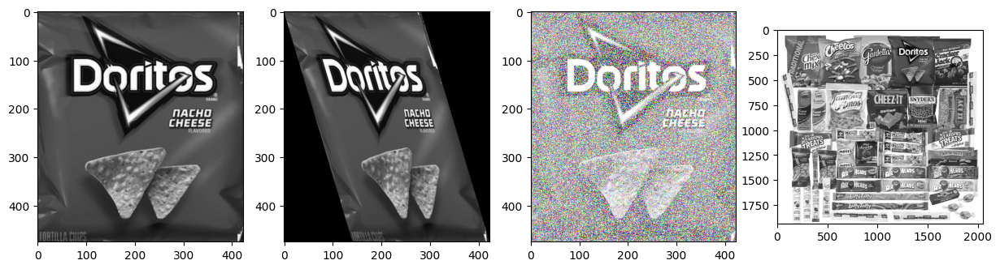

In [47]:
img1 = cv2.imread("img1.jpg", cv2.IMREAD_GRAYSCALE)
img1 = cv2.cvtColor(img1,cv2.COLOR_BGR2RGB)

img1_c = cv2.imread("img1_cropped.jpg", cv2.IMREAD_GRAYSCALE)
img1_c = cv2.cvtColor(img1_c,cv2.COLOR_BGR2RGB)

img1_noisy = add_gaussian_noise(img1_c)

rows, cols = img1_c.shape[:2]
pts_src = np.float32([[0, 0], [cols, 0], [0, rows], [cols, rows]])
pts_dst = np.float32([[0, 0], [cols-cols/3, 0], [cols/3, rows], [cols, rows]])
M = cv2.getPerspectiveTransform(pts_src, pts_dst)
img1_pres = cv2.warpPerspective(img1_c, M, (cols, rows))

fig, ax = plt.subplots(1, 4, figsize=(15, 5))
ax[0].imshow(img1_c)
ax[1].imshow(img1_pres)
ax[2].imshow(img1_noisy)
ax[3].imshow(img1)
plt.show()

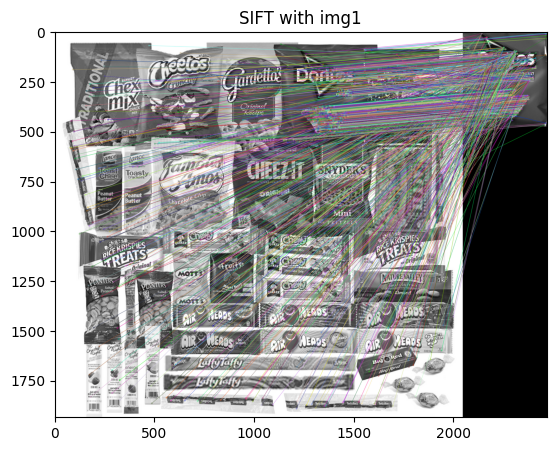

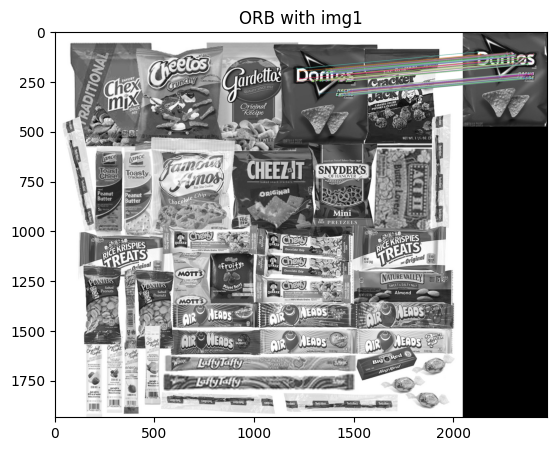

In [48]:
kp1_sift, kp2_sift, matches_sift = detect_match(img1, img1_c, SIFT, is_sift=True)
show_matches(img1, img1_c, kp1_sift, kp2_sift, matches_sift, "SIFT with img1")

kp1_orb, kp2_orb, matches_orb = detect_match(img1, img1_c, ORB)
show_matches(img1, img1_c, kp1_orb, kp2_orb, matches_orb, "ORB with img1")

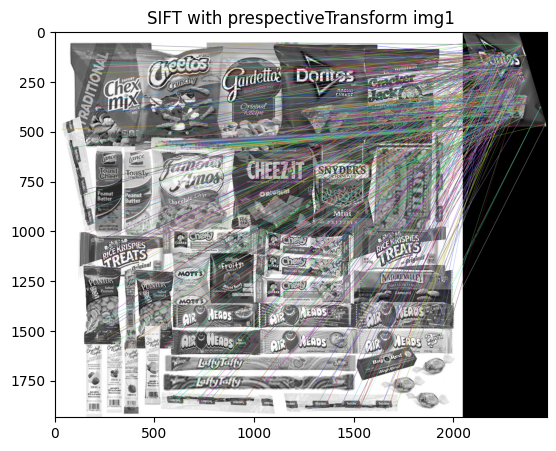

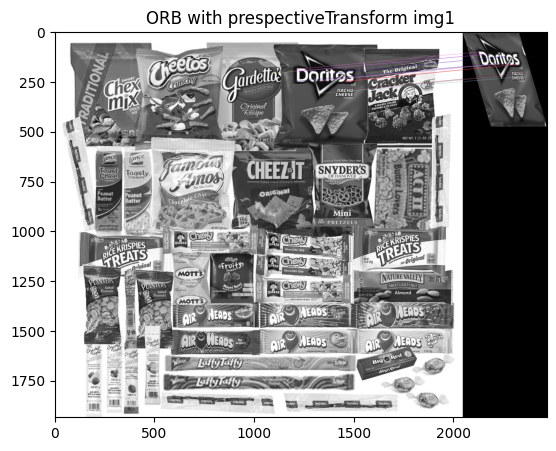

In [50]:
kp1_sift, kp2_sift, matches_sift = detect_match(img1, img1_pres, SIFT, is_sift=True)
show_matches(img1, img1_pres, kp1_sift, kp2_sift, matches_sift, "SIFT with prespectiveTransform img1")

kp1_orb, kp2_orb, matches_orb = detect_match(img1, img1_pres, ORB)
show_matches(img1, img1_pres, kp1_orb, kp2_orb, matches_orb, "ORB with prespectiveTransform img1")

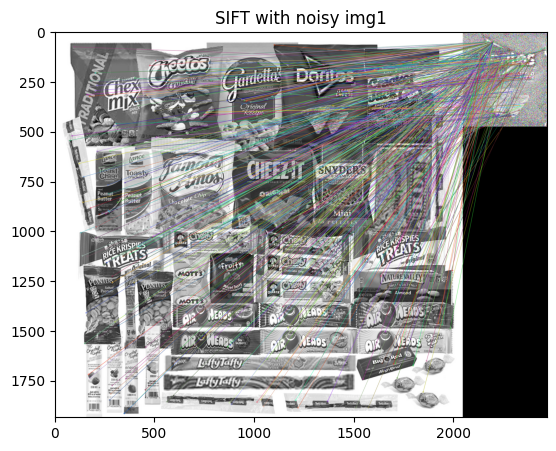

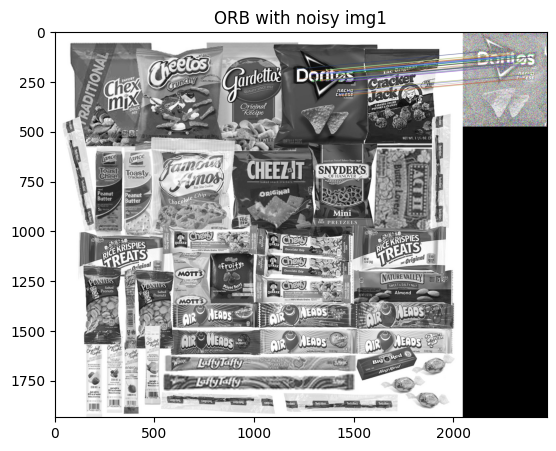

In [51]:
kp1_sift, kp2_sift, matches_sift = detect_match(img1, img1_noisy, SIFT, is_sift=True)
show_matches(img1, img1_noisy, kp1_sift, kp2_sift, matches_sift, "SIFT with noisy img1")

kp1_orb, kp2_orb, matches_orb = detect_match(img1, img1_noisy, ORB)
show_matches(img1, img1_noisy, kp1_orb, kp2_orb, matches_orb, "ORB with noisy img1")

## Image 2

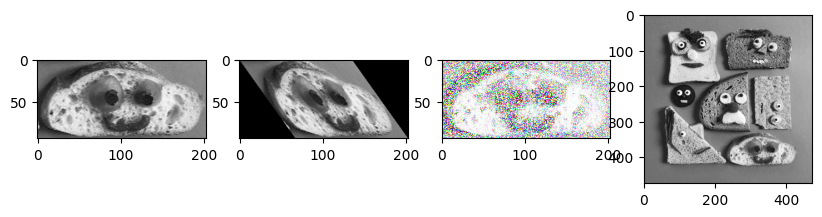

In [43]:
img2 = cv2.imread("img2.jpg", cv2.IMREAD_GRAYSCALE)
img2 = cv2.cvtColor(img2,cv2.COLOR_BGR2RGB)

img2_c = cv2.imread("img2_cropped.jpg", cv2.IMREAD_GRAYSCALE)
img2_c = cv2.cvtColor(img2_c,cv2.COLOR_BGR2RGB)

img2_noisy = add_gaussian_noise(img2_c)

rows, cols = img2_c.shape[:2]
pts_src = np.float32([[0, 0], [cols, 0], [0, rows], [cols, rows]])
pts_dst = np.float32([[0, 0], [cols-cols/3, 0], [cols/3, rows], [cols, rows]])
M = cv2.getPerspectiveTransform(pts_src, pts_dst)
img2_pres = cv2.warpPerspective(img2_c, M, (cols, rows))

fig, ax = plt.subplots(1, 4, figsize=(10, 5))
ax[0].imshow(img2_c)
ax[1].imshow(img2_pres)
ax[2].imshow(img2_noisy)
ax[3].imshow(img2)
plt.show()

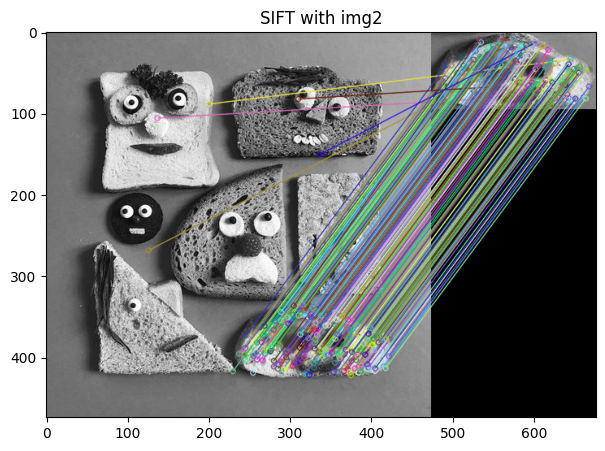

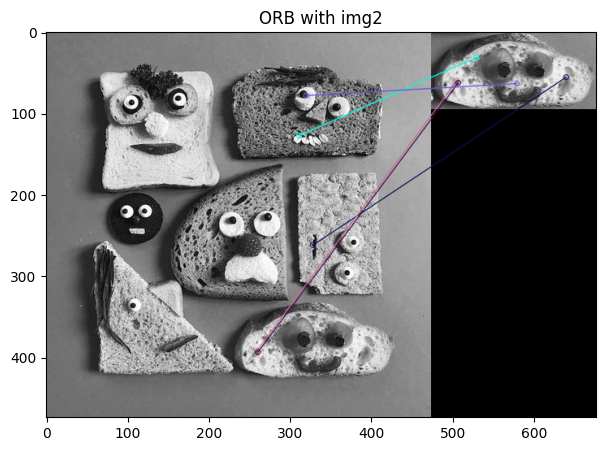

In [44]:
kp1_sift, kp2_sift, matches_sift = detect_match(img2, img2_c, SIFT, is_sift=True)
show_matches(img2, img2_c, kp1_sift, kp2_sift, matches_sift, "SIFT with img2")

kp1_orb, kp2_orb, matches_orb = detect_match(img2, img2_c, ORB)
show_matches(img2, img2_c, kp1_orb, kp2_orb, matches_orb, "ORB with img2")


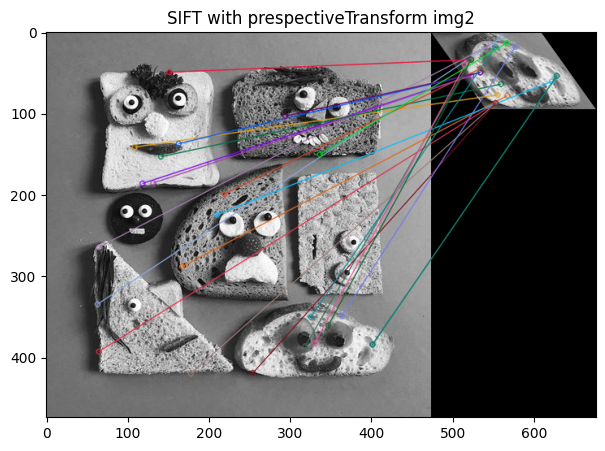

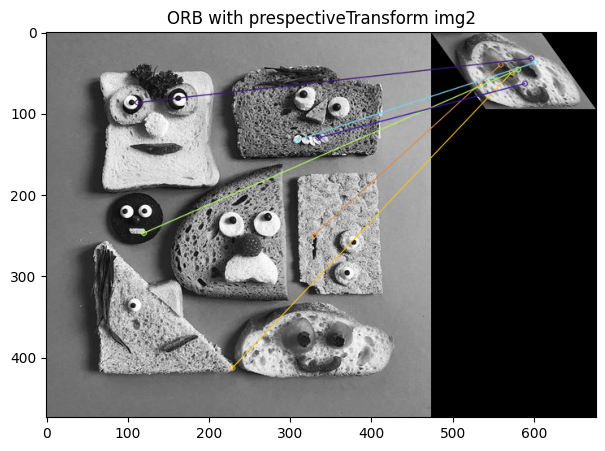

In [45]:
kp1_sift, kp2_sift, matches_sift = detect_match(img2, img2_pres, SIFT, is_sift=True)
show_matches(img2, img2_pres, kp1_sift, kp2_sift, matches_sift, "SIFT with prespectiveTransform img2")

kp1_orb, kp2_orb, matches_orb = detect_match(img2, img2_pres, ORB)
show_matches(img2, img2_pres, kp1_orb, kp2_orb, matches_orb, "ORB with prespectiveTransform img2")


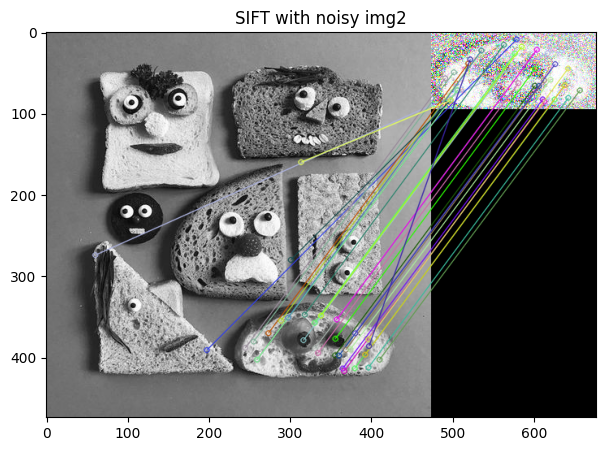

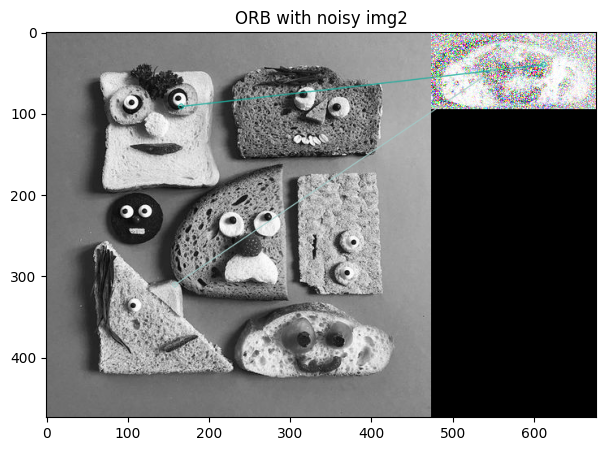

In [46]:
kp1_sift, kp2_sift, matches_sift = detect_match(img2, img2_noisy, SIFT, is_sift=True)
show_matches(img2, img2_noisy, kp1_sift, kp2_sift, matches_sift, "SIFT with noisy img2")

kp1_orb, kp2_orb, matches_orb = detect_match(img2, img2_noisy, ORB)
show_matches(img2, img2_noisy, kp1_orb, kp2_orb, matches_orb, "ORB with noisy img2")

## Image 3

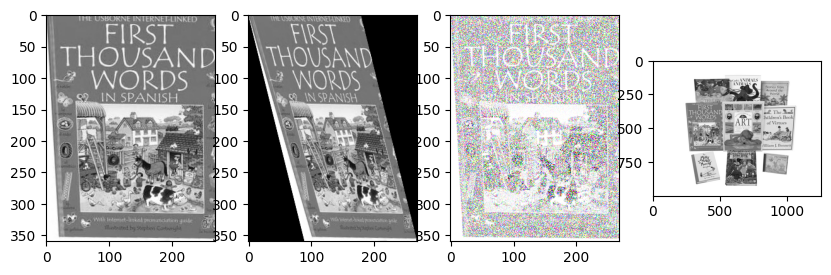

In [39]:
img3 = cv2.imread("img3.jpg", cv2.IMREAD_GRAYSCALE)
img3 = cv2.cvtColor(img3,cv2.COLOR_BGR2RGB)

img3_c = cv2.imread("img3_cropped.jpg", cv2.IMREAD_GRAYSCALE)
img3_c = cv2.cvtColor(img3_c,cv2.COLOR_BGR2RGB)

img3_noisy = add_gaussian_noise(img3_c)

rows, cols = img3_c.shape[:2]
pts_src = np.float32([[0, 0], [cols, 0], [0, rows], [cols, rows]])
pts_dst = np.float32([[0, 0], [cols-cols/3, 0], [cols/3, rows], [cols, rows]])
M = cv2.getPerspectiveTransform(pts_src, pts_dst)
img3_pres = cv2.warpPerspective(img3_c, M, (cols, rows))

fig, ax = plt.subplots(1, 4, figsize=(10, 5))
ax[0].imshow(img3_c)
ax[1].imshow(img3_pres)
ax[2].imshow(img3_noisy)
ax[3].imshow(img3)
plt.show()

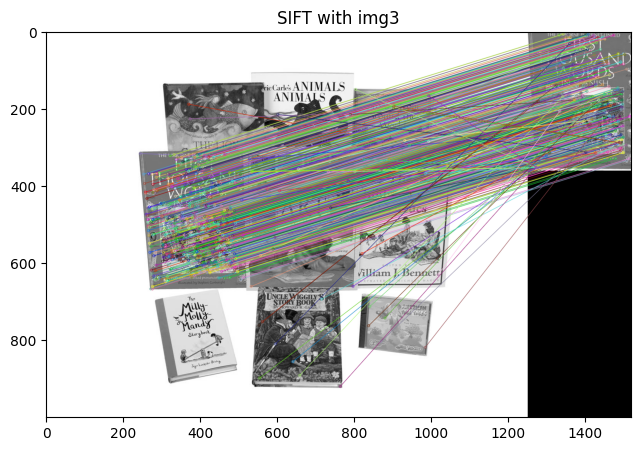

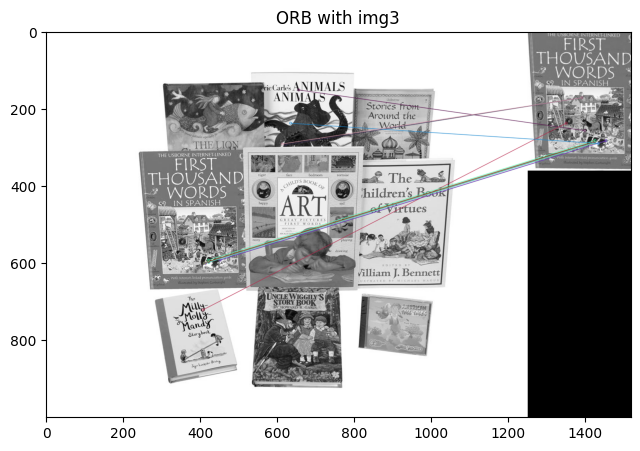

In [40]:
kp1_sift, kp2_sift, matches_sift = detect_match(img3, img3_c, SIFT, is_sift=True)
show_matches(img3, img3_c, kp1_sift, kp2_sift, matches_sift, "SIFT with img3")

kp1_orb, kp2_orb, matches_orb = detect_match(img3, img3_c, ORB)
show_matches(img3, img3_c, kp1_orb, kp2_orb, matches_orb, "ORB with img3")


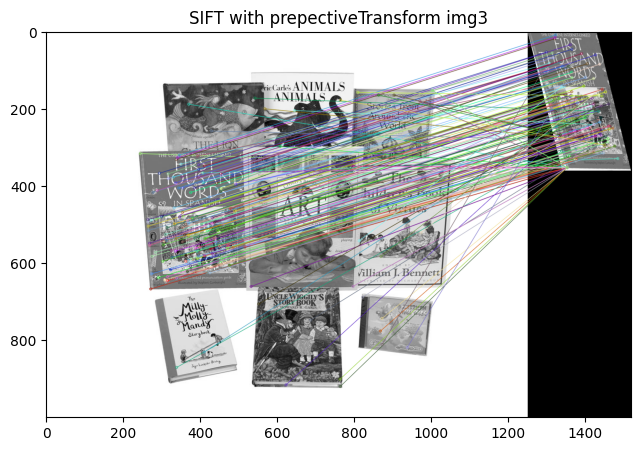

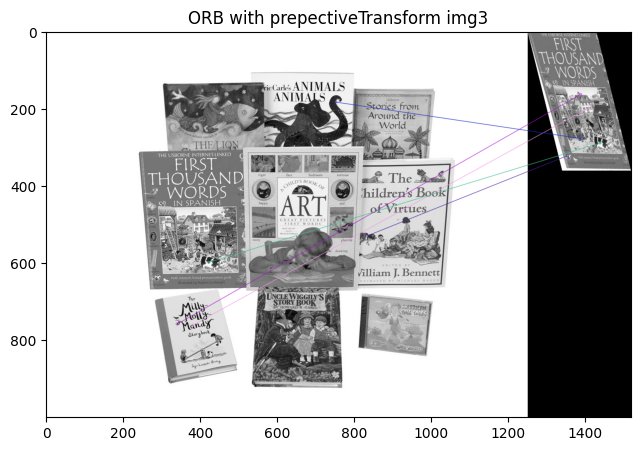

In [41]:
kp1_sift, kp2_sift, matches_sift = detect_match(img3, img3_pres, SIFT, is_sift=True)
show_matches(img3, img3_pres, kp1_sift, kp2_sift, matches_sift, "SIFT with prepectiveTransform img3")

kp1_orb, kp2_orb, matches_orb = detect_match(img3, img3_pres, ORB)
show_matches(img3, img3_pres, kp1_orb, kp2_orb, matches_orb, "ORB with prepectiveTransform img3")


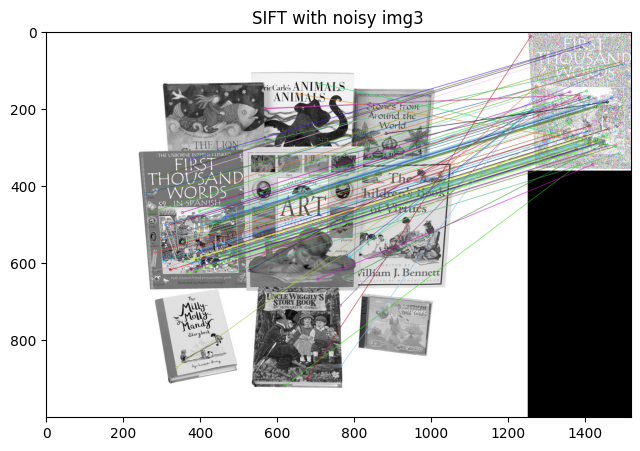

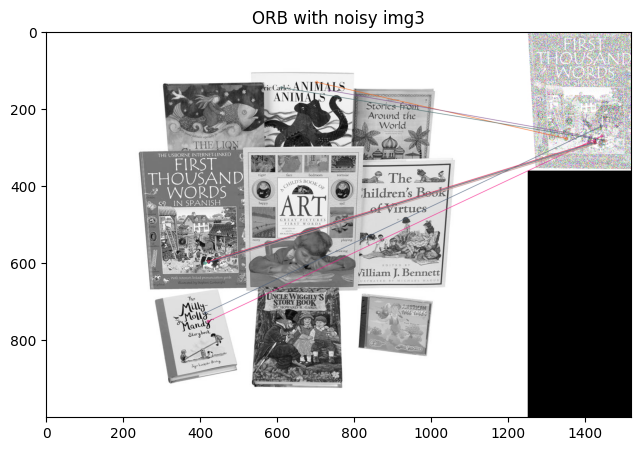

In [42]:
kp1_sift, kp2_sift, matches_sift = detect_match(img3, img3_noisy, SIFT, is_sift=True)
show_matches(img3, img3_noisy, kp1_sift, kp2_sift, matches_sift, "SIFT with noisy img3")

kp1_orb, kp2_orb, matches_orb = detect_match(img3, img3_noisy, ORB)
show_matches(img3, img3_noisy, kp1_orb, kp2_orb, matches_orb, "ORB with noisy img3")

## Image 4

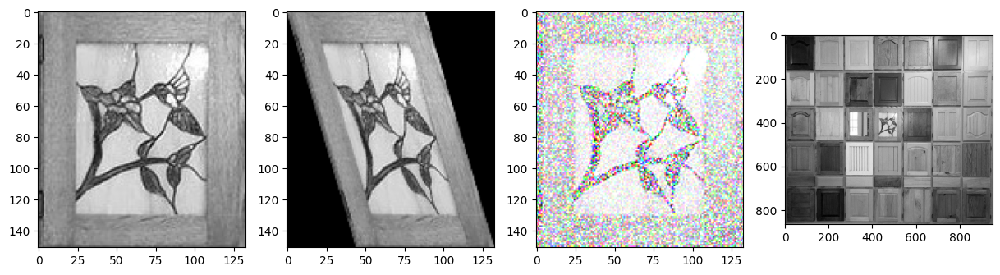

In [30]:
img4 = cv2.imread("img4.jpg", cv2.IMREAD_GRAYSCALE)
img4 = cv2.cvtColor(img4,cv2.COLOR_BGR2RGB)

img4_c = cv2.imread("img4_cropped.jpg", cv2.IMREAD_GRAYSCALE)
img4_c = cv2.cvtColor(img4_c,cv2.COLOR_BGR2RGB)

img4_noisy = add_gaussian_noise(img4_c)

rows, cols = img4_c.shape[:2]
pts_src = np.float32([[0, 0], [cols, 0], [0, rows], [cols, rows]])
pts_dst = np.float32([[0, 0], [cols-cols/3, 0], [cols/3, rows], [cols, rows]])
M = cv2.getPerspectiveTransform(pts_src, pts_dst)
img4_pres = cv2.warpPerspective(img4_c, M, (cols, rows))


fig, ax = plt.subplots(1, 4, figsize=(15, 5))
ax[0].imshow(img4_c)
ax[1].imshow(img4_pres)
ax[2].imshow(img4_noisy)
ax[3].imshow(img4)
plt.show()

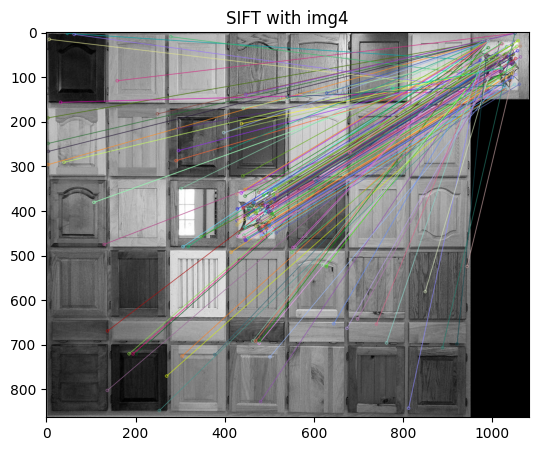

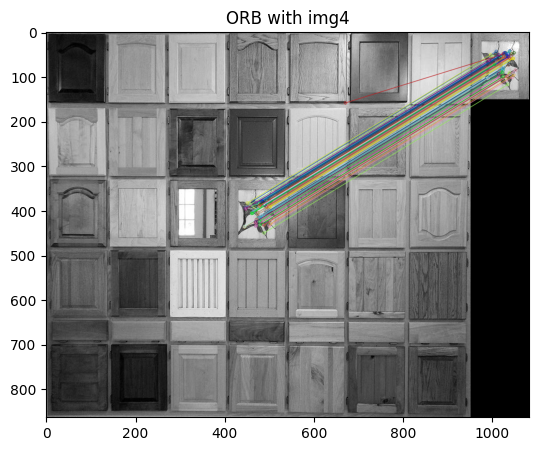

In [18]:
kp1_sift, kp2_sift, matches_sift = detect_match(img4, img4_c, SIFT, is_sift=True)
show_matches(img4, img4_c, kp1_sift, kp2_sift, matches_sift, "SIFT with img4")

kp1_orb, kp2_orb, matches_orb = detect_match(img4, img4_c, ORB)
show_matches(img4, img4_c, kp1_orb, kp2_orb, matches_orb, "ORB with img4")


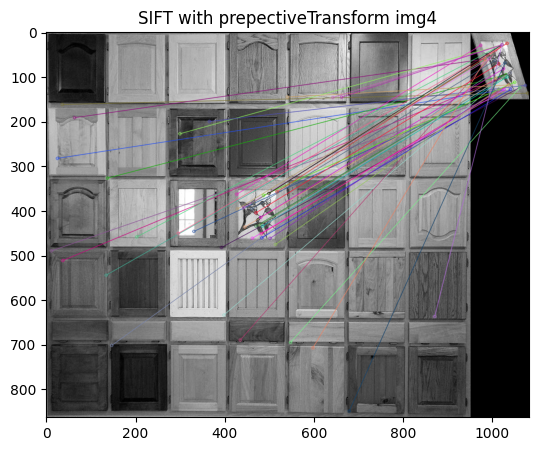

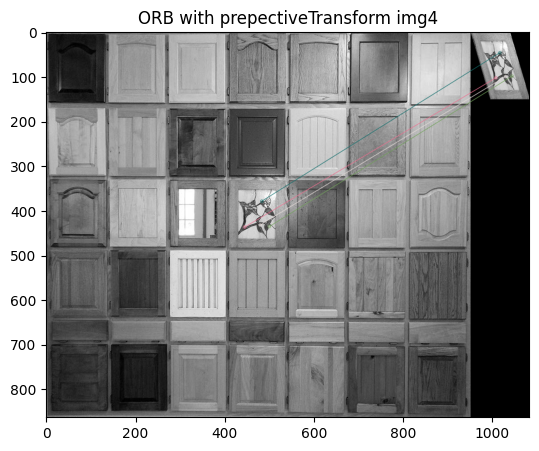

In [32]:
kp1_sift, kp2_sift, matches_sift = detect_match(img4, img4_pres, SIFT, is_sift=True)
show_matches(img4, img4_pres, kp1_sift, kp2_sift, matches_sift, "SIFT with prepectiveTransform img4")

kp1_orb, kp2_orb, matches_orb = detect_match(img4, img4_pres, ORB)
show_matches(img4, img4_pres, kp1_orb, kp2_orb, matches_orb, "ORB with prepectiveTransform img4")


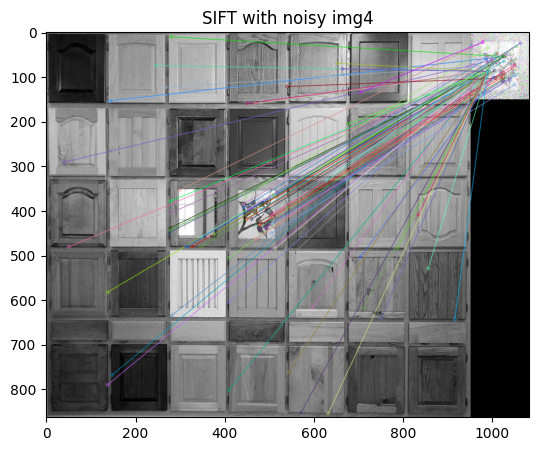

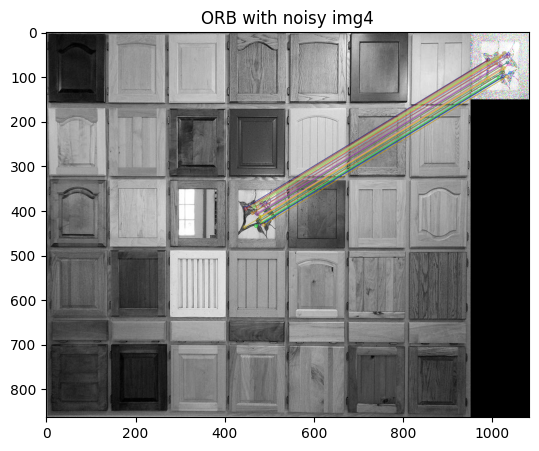

In [33]:
kp1_sift, kp2_sift, matches_sift = detect_match(img4, img4_noisy, SIFT, is_sift=True)
show_matches(img4, img4_noisy, kp1_sift, kp2_sift, matches_sift, "SIFT with noisy img4")

kp1_orb, kp2_orb, matches_orb = detect_match(img4, img4_noisy, ORB)
show_matches(img4, img4_noisy, kp1_orb, kp2_orb, matches_orb, "ORB with noisy img4")

## Image 5

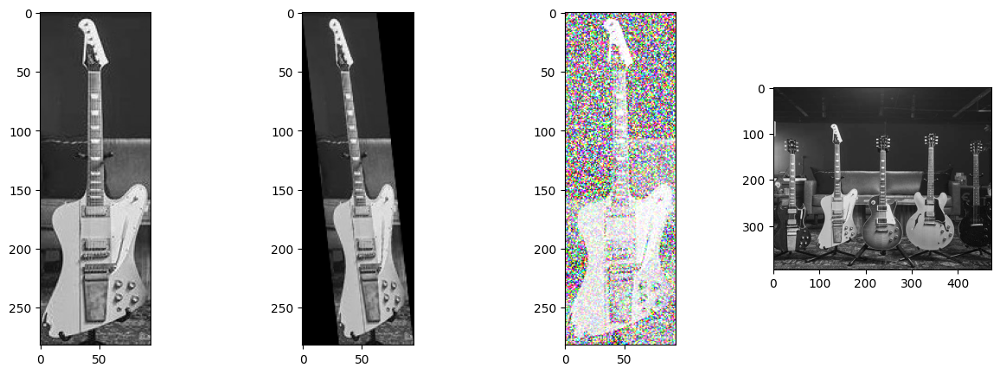

In [35]:
img5 = cv2.imread("img5.jpeg", cv2.IMREAD_GRAYSCALE)
img5 = cv2.cvtColor(img5,cv2.COLOR_BGR2RGB)

img5_c = cv2.imread("img5_cropped.jpeg", cv2.IMREAD_GRAYSCALE)
img5_c = cv2.cvtColor(img5_c,cv2.COLOR_BGR2RGB)

img5_noisy = add_gaussian_noise(img5_c)

rows, cols = img5_c.shape[:2]

pts_src = np.float32([[0, 0], [cols, 0], [0, rows], [cols, rows]])
pts_dst = np.float32([[0, 0], [cols-cols/3, 0], [cols/3, rows], [cols, rows]])

M = cv2.getPerspectiveTransform(pts_src, pts_dst)

img5_pres = cv2.warpPerspective(img5_c, M, (cols, rows))


fig, ax = plt.subplots(1, 4, figsize=(15, 5))
ax[0].imshow(img5_c)
ax[1].imshow(img5_pres)
ax[2].imshow(img5_noisy)
ax[3].imshow(img5)
plt.show()

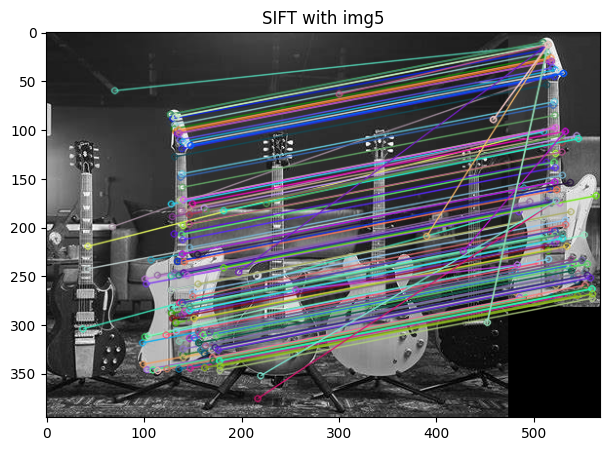

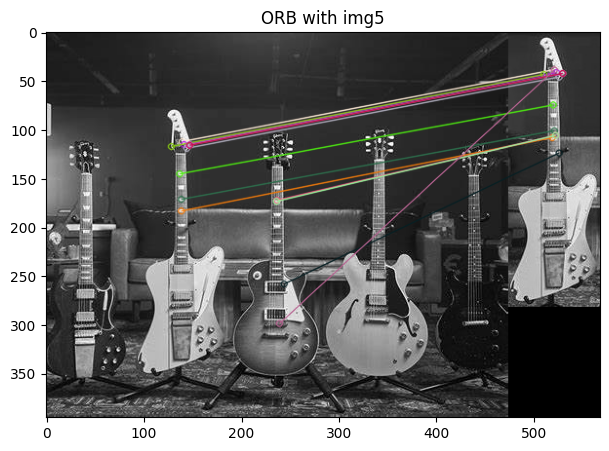

In [36]:
kp1_sift, kp2_sift, matches_sift = detect_match(img5, img5_c, SIFT, is_sift=True)
show_matches(img5, img5_c, kp1_sift, kp2_sift, matches_sift, "SIFT with img5")

kp1_orb, kp2_orb, matches_orb = detect_match(img5, img5_c, ORB)
show_matches(img5, img5_c, kp1_orb, kp2_orb, matches_orb, "ORB with img5")


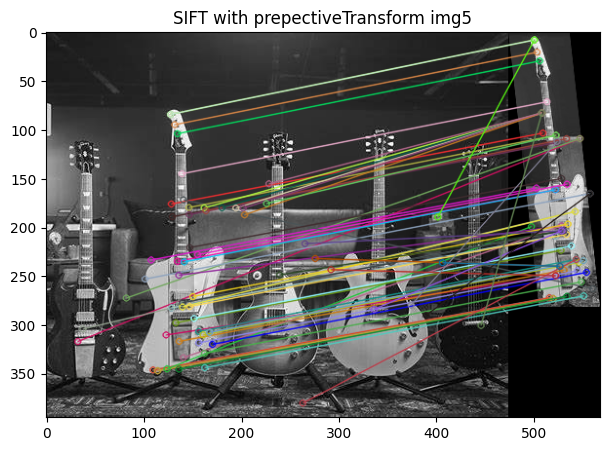

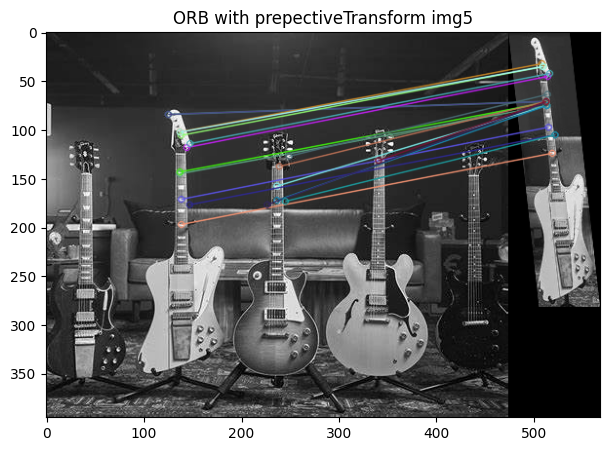

In [37]:
kp1_sift, kp2_sift, matches_sift = detect_match(img5, img5_pres, SIFT, is_sift=True)
show_matches(img5, img5_pres, kp1_sift, kp2_sift, matches_sift, "SIFT with prepectiveTransform img5")

kp1_orb, kp2_orb, matches_orb = detect_match(img5, img5_pres, ORB)
show_matches(img5, img5_pres, kp1_orb, kp2_orb, matches_orb, "ORB with prepectiveTransform img5")


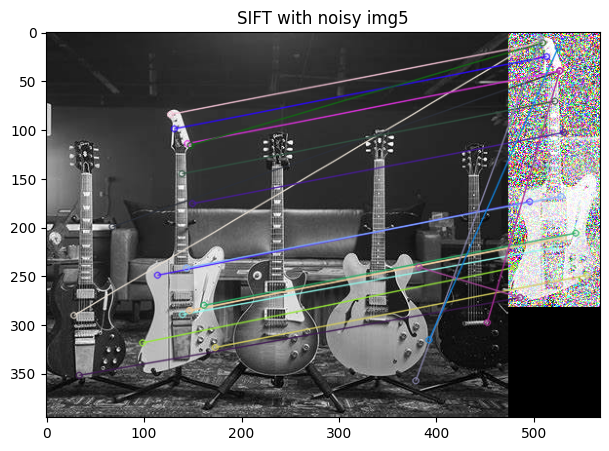

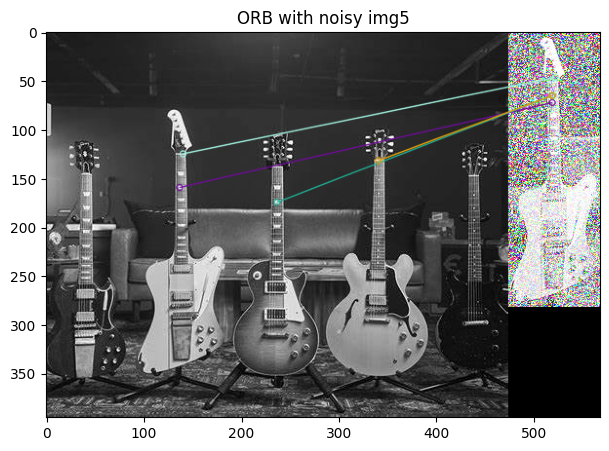

In [38]:
kp1_sift, kp2_sift, matches_sift = detect_match(img5, img5_noisy, SIFT, is_sift=True)
show_matches(img5, img5_noisy, kp1_sift, kp2_sift, matches_sift, "SIFT with noisy img5")

kp1_orb, kp2_orb, matches_orb = detect_match(img5, img5_noisy, ORB)
show_matches(img5, img5_noisy, kp1_orb, kp2_orb, matches_orb, "ORB with noisy img5")

# References

- https://docs.opencv.org/3.4.4/dc/dc3/tutorial_py_matcher.html
- https://tiermaker.com/categories/food-and-drink/cereal-poland-152840
- https://docs.opencv.org/4.x/dc/dc3/tutorial_py_matcher.html
- https://github.com/methylDragon/opencv-python-reference/blob/master/02%20OpenCV%20Feature%20Detection%20and%20Description.md